# Explore LFP (Local Field Potential) Analysis in the Utah Organoids Pipeline


### **Overview**

This notebook guides users through the process of exploring Local Field Potential (LFP) data within the Utah Organoids pipeline. LFP signals capture low-frequency neuronal activity and are useful for analyzing brain state dynamics, oscillatory activity, and spectral properties.

By the end of this notebook, you will:
- Select and inspect an LFP session
- Extract and visualize LFP traces
- Perform spectral analysis


**_Note:_**

- This notebook uses example data, replace values with actual database entries.

### **Key Steps**

- **Setup**

- **Step 1: Select Session of Interest**

- **Step 2: Visualizing LFP Traces**

- **Step 3: Explore Spectral Analysis**


#### **Setup**


In [1]:
import os

if os.path.basename(os.getcwd()) == "notebooks":
    os.chdir("..")

In [2]:
import datajoint as dj
import numpy as np
import matplotlib.pyplot as plt
import datetime
import plotly.graph_objects as go
from plotly.subplots import make_subplots

c:\Users\Organoid PC\anaconda3\envs\utah_organoids\lib\site-packages\datajoint\plugin.py:4: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources


In [3]:
dj.config.load("dj_local_conf_worker.json")
dj.conn()

[2026-01-15 12:48:30,568][INFO]: DataJoint is configured from c:\Users\Organoid PC\Documents\GitHub\utah_organoids\dj_local_conf_worker.json
[2026-01-15 12:48:30,973][INFO]: DataJoint 0.14.4 connected to utah-worker@db.datajoint.com:3306


DataJoint connection (connected) utah-worker@db.datajoint.com:3306

In [104]:
from workflow.pipeline import culture, ephys, probe, analysis, frame

#### **Step 1: Select Session of Interest**


In [5]:
key = (
    ephys.EphysSession * ephys.EphysSessionProbe
    & {
        "organoid_id": "O09",
        "experiment_start_time": datetime.datetime(2023, 5, 3, 17, 33),
        "insertion_number": 0,
        "start_time": datetime.datetime(2023, 5, 4, 4, 12, 52),
        "end_time": datetime.datetime(2023, 5, 4, 4, 27, 52),
    }
).fetch1("KEY")

In [6]:
ephys.EphysSession * ephys.EphysSessionInfo & key

organoid_id e.g. O17,experiment_start_time,insertion_number,start_time,end_time,session_type,session_info Session header info from intan .rhd file. Get this from the first session file.
O09,2023-05-03 17:33:00,0,2023-05-04 04:12:52,2023-05-04 04:27:52,both,=BLOB=


#### **Step 3: Explore `LFP`**


In [8]:
ephys.LFP & key

organoid_id e.g. O17,experiment_start_time,insertion_number,start_time,end_time,lfp_sampling_rate Down-sampled sampling rate (Hz).,execution_duration
O09,2023-05-03 17:33:00,0,2023-05-04 04:12:52,2023-05-04 04:27:52,2500.0,0.00901028


In [9]:
ephys.LFP.Trace & key

organoid_id e.g. O17,experiment_start_time,insertion_number,start_time,end_time,electrode_config_hash,probe_type e.g. A1x32-6mm-100-177-H32_21mm,"electrode electrode index, starts at 0",lfp
O09,2023-05-03 17:33:00,0,2023-05-04 04:12:52,2023-05-04 04:27:52,699af5e0-31fa-acc9-1aeb-132c6972d25e,A1x32-6mm-100-177-H32_21mm,0,=BLOB=
O09,2023-05-03 17:33:00,0,2023-05-04 04:12:52,2023-05-04 04:27:52,699af5e0-31fa-acc9-1aeb-132c6972d25e,A1x32-6mm-100-177-H32_21mm,1,=BLOB=
O09,2023-05-03 17:33:00,0,2023-05-04 04:12:52,2023-05-04 04:27:52,699af5e0-31fa-acc9-1aeb-132c6972d25e,A1x32-6mm-100-177-H32_21mm,2,=BLOB=
O09,2023-05-03 17:33:00,0,2023-05-04 04:12:52,2023-05-04 04:27:52,699af5e0-31fa-acc9-1aeb-132c6972d25e,A1x32-6mm-100-177-H32_21mm,3,=BLOB=
O09,2023-05-03 17:33:00,0,2023-05-04 04:12:52,2023-05-04 04:27:52,699af5e0-31fa-acc9-1aeb-132c6972d25e,A1x32-6mm-100-177-H32_21mm,4,=BLOB=
O09,2023-05-03 17:33:00,0,2023-05-04 04:12:52,2023-05-04 04:27:52,699af5e0-31fa-acc9-1aeb-132c6972d25e,A1x32-6mm-100-177-H32_21mm,5,=BLOB=
O09,2023-05-03 17:33:00,0,2023-05-04 04:12:52,2023-05-04 04:27:52,699af5e0-31fa-acc9-1aeb-132c6972d25e,A1x32-6mm-100-177-H32_21mm,6,=BLOB=
O09,2023-05-03 17:33:00,0,2023-05-04 04:12:52,2023-05-04 04:27:52,699af5e0-31fa-acc9-1aeb-132c6972d25e,A1x32-6mm-100-177-H32_21mm,7,=BLOB=
O09,2023-05-03 17:33:00,0,2023-05-04 04:12:52,2023-05-04 04:27:52,699af5e0-31fa-acc9-1aeb-132c6972d25e,A1x32-6mm-100-177-H32_21mm,8,=BLOB=
O09,2023-05-03 17:33:00,0,2023-05-04 04:12:52,2023-05-04 04:27:52,699af5e0-31fa-acc9-1aeb-132c6972d25e,A1x32-6mm-100-177-H32_21mm,9,=BLOB=


In [32]:
electrode = 30

trace = (ephys.LFP.Trace & key & f"electrode='{electrode}'").fetch1("lfp")

sampling_rate = (ephys.LFP & key).fetch1("lfp_sampling_rate")
time = np.arange(len(trace)) / sampling_rate

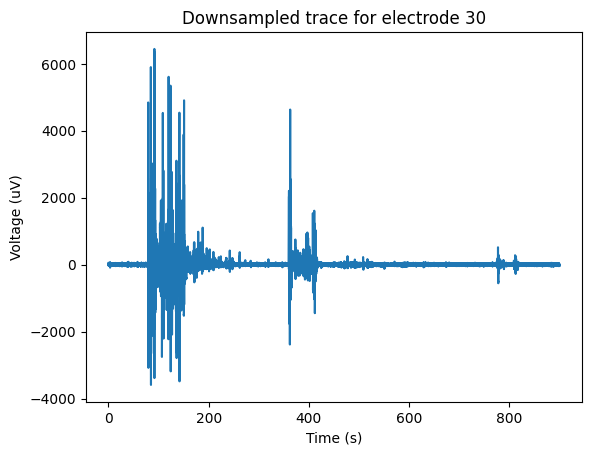

In [33]:
# Plot an example of LFP plot
fig = plt.figure()
plt.plot(time, trace)
plt.xlabel("Time (s)")
plt.ylabel("Voltage (uV)")
plt.title(f"Downsampled trace for electrode {electrode}")
plt.show()


In [34]:
# Filter Trace to Observe Oscillations
from scipy.signal import butter, sosfiltfilt

def butter_bandpass(trace, lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs

    sos = butter(order, np.array([lowcut, highcut])/nyq, btype='bandpass', output='sos')
    filtered_trace = sosfiltfilt(sos, trace)
    
    return filtered_trace

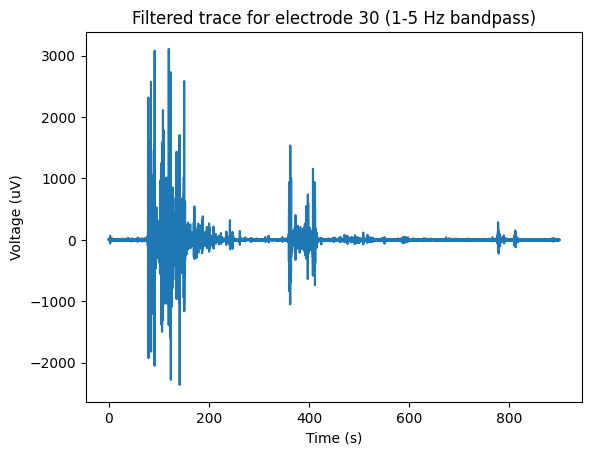

In [36]:
# Create the average LFP Waveform figure
fig = plt.figure()

lowcut = 1
highcut = 5
filtered_trace = butter_bandpass(trace, lowcut=lowcut, highcut=highcut, fs=sampling_rate)

plt.plot(time, filtered_trace)
plt.xlabel("Time (s)")
plt.ylabel("Voltage (uV)")
plt.title(f"Filtered trace for electrode {electrode} ({lowcut}-{highcut} Hz bandpass)")
plt.show()


#### **Step 4: Explore Spectral Analysis**


In [41]:
analysis.LFPSpectrogram.ChannelSpectrogram & key

organoid_id e.g. O17,experiment_start_time,insertion_number,start_time,end_time,electrode_config_hash,probe_type e.g. A1x32-6mm-100-177-H32_21mm,"electrode electrode index, starts at 0",param_idx,spectrogram Spectrogram matrix (freq x time) (μV²/Hz),time Time bins (s),frequency Frequency bins (Hz)
O09,2023-05-03 17:33:00,0,2023-05-04 04:12:52,2023-05-04 04:27:52,699af5e0-31fa-acc9-1aeb-132c6972d25e,A1x32-6mm-100-177-H32_21mm,0,2,=BLOB=,=BLOB=,=BLOB=
O09,2023-05-03 17:33:00,0,2023-05-04 04:12:52,2023-05-04 04:27:52,699af5e0-31fa-acc9-1aeb-132c6972d25e,A1x32-6mm-100-177-H32_21mm,1,2,=BLOB=,=BLOB=,=BLOB=
O09,2023-05-03 17:33:00,0,2023-05-04 04:12:52,2023-05-04 04:27:52,699af5e0-31fa-acc9-1aeb-132c6972d25e,A1x32-6mm-100-177-H32_21mm,2,2,=BLOB=,=BLOB=,=BLOB=
O09,2023-05-03 17:33:00,0,2023-05-04 04:12:52,2023-05-04 04:27:52,699af5e0-31fa-acc9-1aeb-132c6972d25e,A1x32-6mm-100-177-H32_21mm,3,2,=BLOB=,=BLOB=,=BLOB=
O09,2023-05-03 17:33:00,0,2023-05-04 04:12:52,2023-05-04 04:27:52,699af5e0-31fa-acc9-1aeb-132c6972d25e,A1x32-6mm-100-177-H32_21mm,4,2,=BLOB=,=BLOB=,=BLOB=
O09,2023-05-03 17:33:00,0,2023-05-04 04:12:52,2023-05-04 04:27:52,699af5e0-31fa-acc9-1aeb-132c6972d25e,A1x32-6mm-100-177-H32_21mm,5,2,=BLOB=,=BLOB=,=BLOB=
O09,2023-05-03 17:33:00,0,2023-05-04 04:12:52,2023-05-04 04:27:52,699af5e0-31fa-acc9-1aeb-132c6972d25e,A1x32-6mm-100-177-H32_21mm,6,2,=BLOB=,=BLOB=,=BLOB=
O09,2023-05-03 17:33:00,0,2023-05-04 04:12:52,2023-05-04 04:27:52,699af5e0-31fa-acc9-1aeb-132c6972d25e,A1x32-6mm-100-177-H32_21mm,7,2,=BLOB=,=BLOB=,=BLOB=
O09,2023-05-03 17:33:00,0,2023-05-04 04:12:52,2023-05-04 04:27:52,699af5e0-31fa-acc9-1aeb-132c6972d25e,A1x32-6mm-100-177-H32_21mm,8,2,=BLOB=,=BLOB=,=BLOB=
O09,2023-05-03 17:33:00,0,2023-05-04 04:12:52,2023-05-04 04:27:52,699af5e0-31fa-acc9-1aeb-132c6972d25e,A1x32-6mm-100-177-H32_21mm,9,2,=BLOB=,=BLOB=,=BLOB=


In [48]:
# fetch spectrogram data
time, frequency = (analysis.LFPSpectrogram.ChannelSpectrogram & key & "electrode = '0'").fetch1("time", "frequency")
spectrograms, electrodes = (analysis.LFPSpectrogram.ChannelSpectrogram & key).fetch("spectrogram", "electrode")
spectrograms = np.stack(spectrograms)

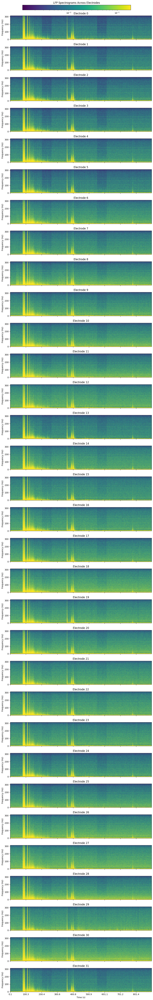

In [81]:
# Plot all electrode spectrograms on one figure

import matplotlib.colors as colors
import numpy as np

# Plot all electrode spectrograms on one figure

# determine color boundaries
cmin = np.percentile(spectrograms, 5)
cmax = np.percentile(spectrograms, 95)

# create subplot figure
fig, ax = plt.subplots(len(electrodes), 1, figsize=(10, 2*len(electrodes)), sharex=True)

# Create normalization with log scale
norm = colors.LogNorm(vmin=cmin, vmax=cmax)

for elec in electrodes:
    elec_spectrogram = spectrograms[elec,:,:]
    
    im = ax[elec].imshow(
        elec_spectrogram,
        aspect='auto',
        origin='lower',
        cmap='viridis',
        norm=norm  # Use the global normalization
    )
    ax[elec].set_ylabel('Frequency (Hz)')
    ax[elec].set_title(f'Electrode {elec}')

plt.xticks(ticks=np.arange(0, len(time), step=800), labels=np.round(time[::800], 1))
plt.xlabel('Time (s)')
plt.tight_layout()

# Add global colorbar (horizontal at top of figure)
cbar_ax = fig.add_axes([0.15, 1, 0.7, 0.005])  # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')

plt.title('LFP Spectrograms Across Electrodes')
plt.show()

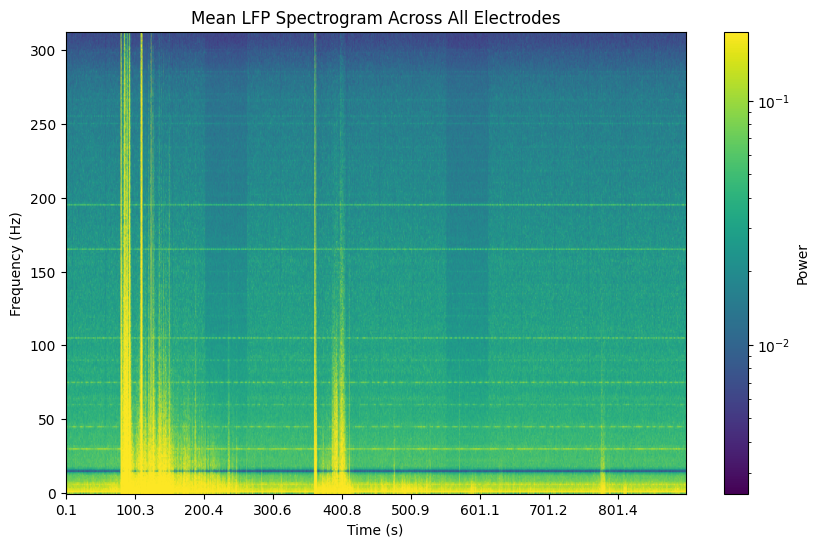

In [83]:
# Plot mean spectrogram across all electrodes (color log scale)
mean_spectrogram = np.mean(spectrograms, axis=0)
norm = colors.LogNorm(vmin=np.min(mean_spectrogram), vmax=np.max(mean_spectrogram))

fig, ax = plt.subplots(figsize=(10, 6))
im = ax.imshow(
    mean_spectrogram,
    aspect='auto',
    origin='lower',
    cmap='viridis',
    norm=norm  # Use the global normalization
)
plt.xticks(ticks=np.arange(0, len(time), step=800), labels=np.round(time[::800], 1))
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.title('Mean LFP Spectrogram Across All Electrodes')
cbar = fig.colorbar(im, ax=ax)
cbar.set_label('Power')
plt.show()

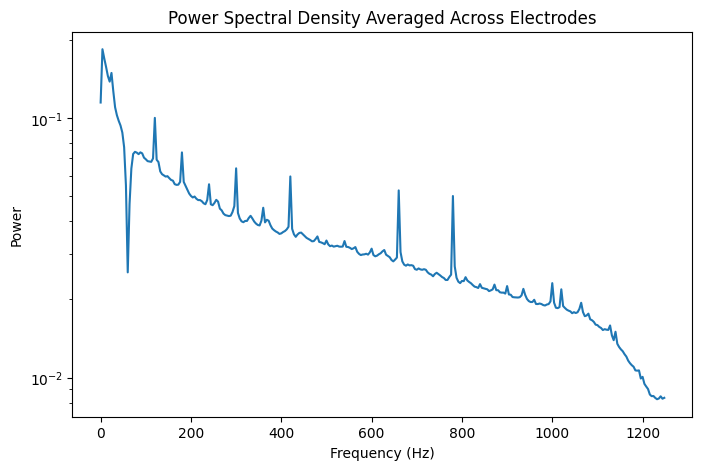

In [88]:
# Plot Power Spectral Density Averaged Across Electrodes

psd_curve = np.mean(spectrograms, axis=(0,2))
plt.figure(figsize=(8,5))
plt.semilogy(frequency, psd_curve)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.title('Power Spectral Density Averaged Across Electrodes')
plt.show()

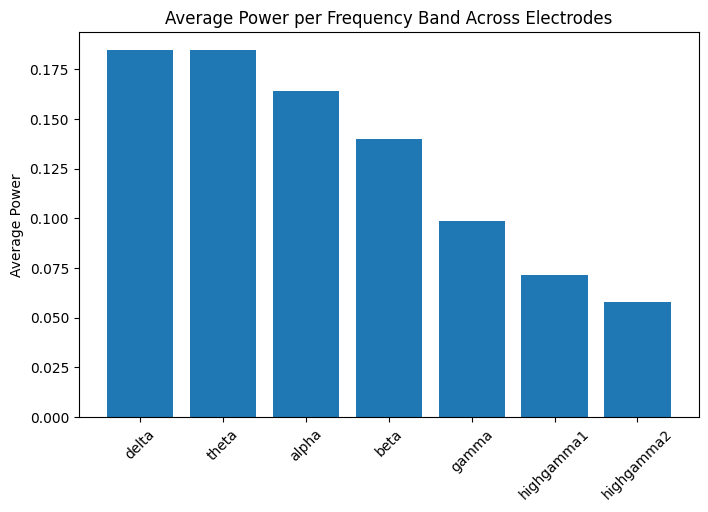

In [103]:
# Plot Frequency Band Power (Bar Plots)
frequency_bands = analysis.SpectralBand.fetch(as_dict=True, order_by="lower_freq")
frequency_bands = dict((band_dict["band_name"], (band_dict["lower_freq"], band_dict["upper_freq"])) for band_dict in frequency_bands)

# Get average power per band across electrodes
band_data = {
    band_name: np.mean(spectrograms[:, (frequency >= low_freq) & (frequency <= high_freq), :])
    for band_name, (low_freq, high_freq) in frequency_bands.items()
}

# Create bar plot
plt.figure(figsize=(8,5))
plt.bar(band_data.keys(), band_data.values())
plt.xticks(rotation=45)
plt.ylabel('Average Power')
plt.title('Average Power per Frequency Band Across Electrodes')
plt.show()

## FOOOF Analysis

In [105]:
frame.FOOOFAnalysis & key

organoid_id e.g. O17,experiment_start_time,insertion_number,start_time,end_time,fooof_param_idx Unique identifier for the FOOOF parameter set,start_freq Start frequency for FOOOF fitting,end_freq End frequency for FOOOF fitting,spec_param_idx Reference to SpectrogramParamset,plot Plot of FOOOF fit (as json),aperiodic_offset Aperiodic offset,aperiodic_knee Aperiodic knee,aperiodic_exponent Aperiodic exponent,peak_center_frequencies Center frequencies of detected peaks,peak_powers Power of detected peaks (above aperiodic fit),peak_bandwidths Bandwidths of detected peaks,error Error of FOOOF fit (RMSE),r_squared R^2 of FOOOF fit
O09,2023-05-03 17:33:00,0,2023-05-04 04:12:52,2023-05-04 04:27:52,1,2.0,200.0,2,=BLOB=,4.41604,0.0,2.01408,=BLOB=,=BLOB=,=BLOB=,0.071174,0.98677


In [107]:
import plotly.io as pio

fooof_plot = (frame.FOOOFAnalysis & key).fetch1("plot")
fig = pio.from_json(fooof_plot)

fig.show()